**Lab 4: FIR filters and envelopes**

The goal of this lab is to learn how to implement FIR filters in Python, and how we can use them to improve our synthesis.

In [7]:
import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram

**1. Overview of Filtering**

For this lab, we will define an FIR filter as a discrete-time system that converts an input signal $x[n]$ into an output signal $y[n]$ by means of the weighted summation:

$$
y[n] = \sum_{k=0}^M b_kx[n-k]
$$

The function *np.convolve()* is a generic function with which to implement FIR filters. The following code implements a three-point averaging system:

In [5]:
fs = 1
x = [np.floor(x/10) for x in range(50)]
b = np.array([1.0/3, 1.0/3, 1.0/3])
y = np.convolve(b, x)

plot_signals([x, y], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

1.1 Explain the filtering action of the 5-point averager by comparing the plot of the input $x[n]$ and the output $y[n]$. This filter might be called a “smoothing” filter. Note how the transitions from one level to another have been “smoothed.”

The 5-point averager, is used to smooth or average a signal. It operates by averaging the current sample and four previous samples from the input signal to create a smoother output. This filtering action reduces the impact of high-frequency noise and sharp transitions in the input. We can see this from the example above by noteching how the transitions last longer and have less of an angle of attack. It's an overall smoother graphic than the blue one.

*1.2* Define a function `averaging_filter(x, N)` which implements the N-points averaging filter using the `np.convolve` function.

In [6]:
import numpy as np

def averaging_filter(x, N):
    """
    Applies an N-point moving-average (boxcar) filter to x.
    Returns a signal with the same length as x.
    """
    if N <= 0 or int(N) != N:
        raise ValueError("N must be a positive integer")
    h = np.ones(int(N), dtype=float) / float(N)   # FIR coefficients
    y = np.convolve(x, h, mode='same')            # keep same length
    return y




1.3 Run the example above using the `averaging_filter` instead. Change the number N to different values and explain what happen.

In [8]:
fs = 1
x = np.array([np.floor(n/10) for n in range(50)], dtype=float)

for N in [3, 5, 9]:
    y = averaging_filter(x, N)
    plot_signals([x, y], fs, name=[f'input x[n]', f'output y[n] (N={N})'], mode='lines+markers')



As N increases, the output becomes smoother (more high-frequency attenuation), the edges/steps spread out (slower transitions), and you see a constant delay of about (N−1)/2 samples. 

1.4 How would you classify this filter, as a low-pass o high-pass filter?

It smooths the signal by averaging a range of samples, which effectively reduces the impact of high-frequency noise or rapid changes in the signal. This behavior makes it a low-pass filter, as it passes the lower-frequency components and attenuates the higher-frequency components, resulting in a smoother signal.







---

**2. Envelope detector**

Now we'll implement an envelope detector by concatenating two systems: a full-wave rectifier (absolute value) and the N-point averaging filter.

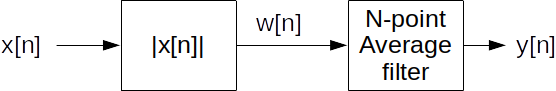

2.1 Define a function `envelope(x, N)` which applies an N-point averaging filter to the full-wave rectified signal and returns the output $y[n]$.

**Note 1**: to calculate the full-wave rectified signal check the `np.abs()` function.

**Note 2**: The output should have the same length as the input signal. Use 'same' mode (see [np.convolve](https://numpy.org/doc/stable/reference/generated/numpy.convolve.html) documentation).

In [10]:
import numpy as np

def envelope(x, N):
    """
    Extracts the envelope of x by full-wave rectification + N-point moving average.
    Output has the same length as x.
    """
    if N <= 0 or int(N) != N:
        raise ValueError("N must be a positive integer")
    xr = np.abs(x)                              
    h  = np.ones(int(N), dtype=float) / float(N)   
    y  = np.convolve(xr, h, mode='same')        
    return y




2.2 Load your reference signal and calculate its envelope using the function you designed. Plot the reference signal and envelope in the same figure.

In [ ]:
from util import load_audio, plot_signals

FILEPATH = "./sis1-group102/labs/audio/audioSisLabs.wav"  
x, fs = load_audio(FILEPATH)

N = 201                         # start with a reasonable window (t ≈ N/fs seconds)
y_env = envelope(x, N)

plot_signals([x, y_env], fs, name=['reference x[n]', f'envelope (N={N})'])


2.3 Change the number N to get a good result. What happens when you change the number N?

Increasing N makes the envelope smoother and reduces fast fluctuations (stronger low-pass), but it also adds a larger delay ( aprox (N−1)/2 samples) and can round peaks and smear transients. Decreasing N tracks amplitude faster with less delay, but the envelope becomes noisier. For very large N, boundary effects are more visible because of convolution near the edges.

2.4 Explain with your own words why this system achieves extracting the envelope. It might be useful to plot together the signals $x[n]$, $w[n]$ and $y[n]$.

2.5 Now let's apply this envelope to the synthesized signal. Copy the code from Lab3 Ex. 2.1 and generate the synthesized signal. Then multiply the synthesized signal by the envelope. Note that both signal and envelope should have the same length. You can define a time vector of the same length of the envelope to create the signal:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

def synthesize(f0, phi, Ak, t):
    y = np.zeros_like(t, dtype=float)
    for k, Ak_k in enumerate(Ak, start=1):
        y += Ak_k * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
    return y


# envelope (same function used in 2.1)
N_env = 201
env = envelope(x, N_env)

t = np.arange(len(env)) / fs
)
f0  = 375.053
Ak = np.array([0.68162, 0.12600, 0.31265, 0.14200, 0.08153, 0.28873])
phi = 5.28

y_car = synthesize(f0, phi, Ak, t)
y_car = y_car / (np.max(np.abs(y_car)) + 1e-12)   

y_synt = env * y_car

from util import plot_signals
plot_signals([x, env, y_synt], fs, name=['reference x[n]', f'envelope (N={N_env})', 'synth = envelope × harmonics'])



2.6. Compare the spectrograms of the reference signal and the synthesized signal. What are the main differences?

Text(0.5, 1.0, 'synth × envelope')

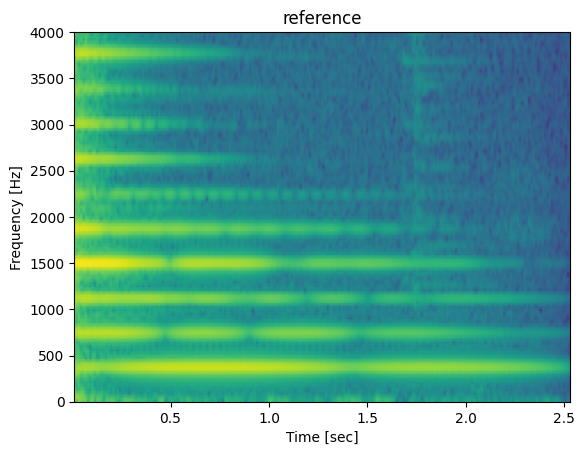

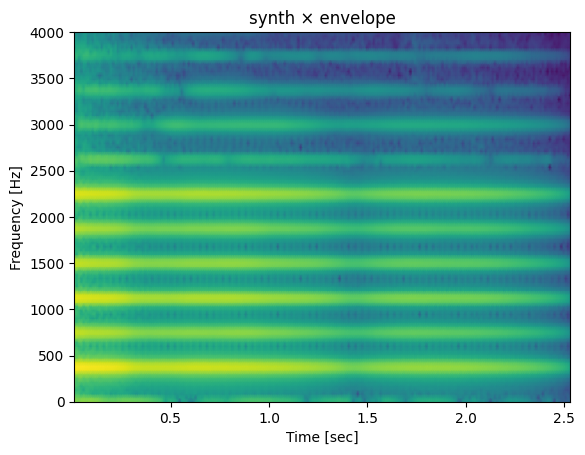

In [14]:
import numpy as np, matplotlib.pyplot as plt
from scipy.signal import spectrogram, get_window

# make sure signals have the same length
L = min(len(x), len(y_synt))
xref = x[:L]
ysyn = y_synt[:L]

# 32 ms Hann (power of two)
Nw  = 2**int(np.round(np.log2(0.032*fs)))
win = get_window('hann', Nw)

def spec(sig):
    f,t,S = spectrogram(sig, fs=fs, window=win, nperseg=Nw,
                        noverlap=Nw//2, nfft=Nw, mode='magnitude',
                        detrend=False, scaling='spectrum')
    return f,t,S

f1,t1,S1 = spec(xref)
f2,t2,S2 = spec(ysyn)

plt.figure(); plot_spectrogram(f1,t1,S1); plt.ylim(0,4000); plt.title('reference')
plt.figure(); plot_spectrogram(f2,t2,S2); plt.ylim(0,4000); plt.title('synth × envelope')

Both show harmonic lines at multiples of the fundamental, but the synthesized signal has much cleaner harmonics whose intensity follows the envelope; there is almost no energy between the lines and little high-frequency content beyond the chosen partials. The reference has broader peaks on top of a clear noise floor, faint inharmonic or formant-like bands, and stronger decay traces, so it looks  more complex.

2.7 Listen to the synthesized signal and compare it to the reference.



In [15]:
from IPython.display import Audio, display
display(Audio(xref, rate=fs))    
display(Audio(ysyn, rate=fs))

The synthesized audio keeps the same pitch and overall loudness shape but sounds more buzzy or pure, with fewer transients and little background noise. The reference sounds fuller and more natural thanks to extra high-frequency and inharmonic energy and subtle time-varying details that the simple model does not reproduce. Comparing it to other synhtesized audios from in previous labs, this is much closer to the reference signal.